# Exercise 2: Implicit Shape Model
**Task**: Develop a first prototype of your own ***Implicit Shape Model*** object detection system.

### Preparation
1. Take several images (at least 10) for an object that is of interest to you in front of a homogeneous background or in front of a blue screen.
2. Take as many images of a typical background of you object type.
3. Take as many images of an object in front of typical background.

### Software development
1. Code a jupyter notebook (you may take this as a starting point) that trains an implicit shape model for your object class. Take the lecture slides and Leibe, B., Leonardis, A., & Schiele, B. (2004, May). Combined object categorization and segmentation with an implicit shape model. In Workshop on statistical learning in computer vision, ECCV (Vol. 2, No. 5, p. 7) as a role model.
2. Code a jupyter notebook that uses the trained model to detect objects in front of background.

# Feature Extraction with Non‑Maximum Suppression
**Goal**: Extract features, apply non‑maximum suppression (NMS) so that no low‑response keypoint survives within the radius (`size / 2`) of a stronger keypoint, and visualise both the raw and pruned sets.

### Pipeline
1. Load & display images
2. Extract keypoints/descriptors
3. Visualise **all** raw keypoints
4. Apply NMS
5. Visualise **retained** keypoints
6. Save the NMS‑pruned descriptors and keypoint metadata

**Dependencies**: `opencv-python`, `numpy`, `matplotlib`.

In [82]:
# Import modules
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

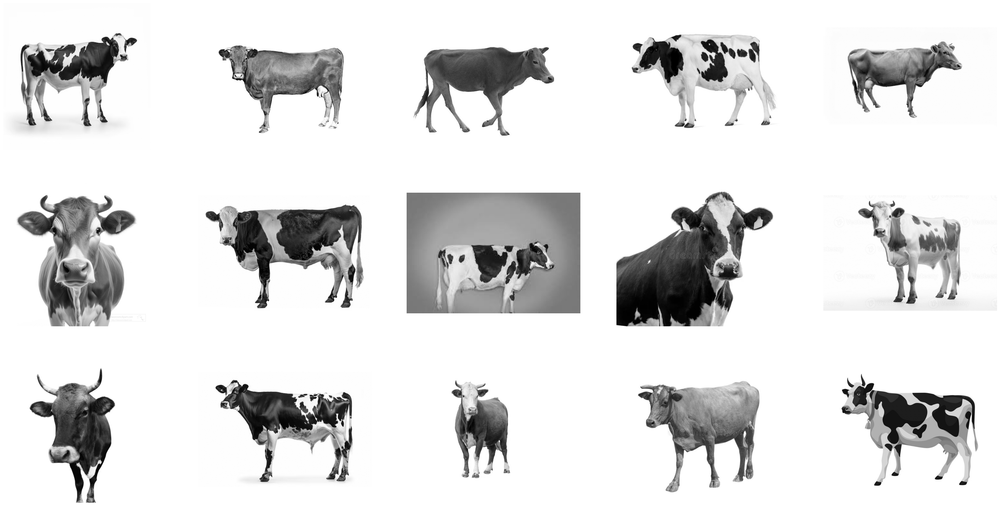

In [83]:
# 1. Load & display images
file_names = os.listdir('images/cows')
cow_imgs = [cv.imread(f'images/cows/{file_name}', cv.IMREAD_GRAYSCALE) for file_name in file_names]
# cow_imgs = [cv.resize(img, (img.shape[1], img.shape[0])) for img in cow_imgs]

def showImages(imgs, rows=1, cols=10, cmap="gray"):
    fig = plt.figure(figsize=(40, 20))
    for i, img in enumerate(imgs, 1):
        fig.add_subplot(rows, cols, i)
        plt.imshow(img, cmap=cmap)
        plt.axis("off")
    plt.show()

showImages(cow_imgs, rows=3, cols=5)        

In [84]:
# 2. Extract keypoints/descriptors
sift = cv.ORB_create() # nfeatures=1000
kp_dsp = [sift.detectAndCompute(cow_img, None) for cow_img in cow_imgs] # keypoints & descriptors
keypoints = [kp[0] for kp in kp_dsp]
descriptors = [kp[1] for kp in kp_dsp]

print([len(kp_data) for kp_data in keypoints])

[500, 500, 500, 500, 500, 500, 500, 400, 500, 500, 500, 500, 500, 500, 500]


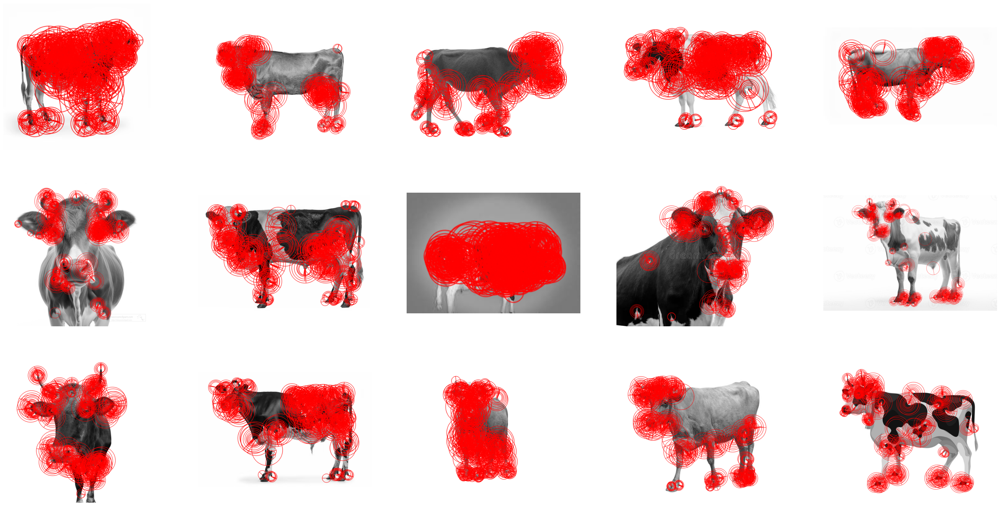

In [85]:
# 3. Visualise all raw keypoints
keypoint_imgs = [cv.drawKeypoints(img, keypoint, np.zeros(img.shape), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(255, 0, 0)) for img, keypoint in zip(cow_imgs, keypoints)]
showImages(keypoint_imgs, rows=3, cols=5)

In [86]:
kp = keypoints[0][0]
print("Position:", kp.pt)
print("Größe:", kp.size)
print("Orientierung:", kp.angle)
print("Antwortwert:", kp.response)
print("Oktave:", kp.octave)
print("Klassen-ID:", kp.class_id)

Position: (275.0, 76.0)
Größe: 31.0
Orientierung: 243.93035888671875
Antwortwert: 0.002890711883082986
Oktave: 0
Klassen-ID: -1


In [87]:
# 4. Apply NMS

euclidian = lambda kp1, kp2: np.sqrt(((kp1.pt[0] - kp2.pt[0]) ** 2) + ((kp1.pt[1] - kp2.pt[1]) ** 2))
threshold = 15

def applyNMS(keypoints, descriptors):

  all_keypoints = []
  all_descriptors = []

  # iterate over every image
  for kp_data, dp_data in zip(keypoints, descriptors):

    # iterate over every single keypoint
    sorted_responses = np.argsort([kp.response for kp in kp_data])
    sorted_kp_np = np.array(kp_data)[sorted_responses]
    sorted_dp_np = np.array(dp_data)[sorted_responses]

    cleaned_keypoints = []
    cleaned_descriptors = []

    sorted_kp = sorted_kp_np.tolist()
    sorted_dp = sorted_dp_np.tolist()

    while sorted_kp:

      fixed_kp = sorted_kp.pop(0)
      fixed_dp = sorted_dp.pop(0)

      cleaned_keypoints.append(fixed_kp)
      cleaned_descriptors.append(fixed_dp)

      indices_to_delete = []

      for i, curr_kp in enumerate(sorted_kp):
        distance = euclidian(fixed_kp, curr_kp)

        if distance < threshold:
          indices_to_delete.append(i)

      # delete keypoints which are too close
      for i in sorted(indices_to_delete, reverse=True):
        sorted_kp.pop(i)
        sorted_dp.pop(i)

    all_keypoints.append(cleaned_keypoints)
    all_descriptors.append(cleaned_descriptors)

  return all_keypoints, all_descriptors

keypoints_nms, descriptors_nms = applyNMS(keypoints, descriptors)

kp_len = [len(kp_data) for kp_data in keypoints_nms]
dp_len = [len(dp_data) for dp_data in descriptors_nms]
assert kp_len == dp_len
print(kp_len)

[47, 40, 53, 54, 52, 55, 62, 25, 58, 58, 50, 62, 54, 52, 59]


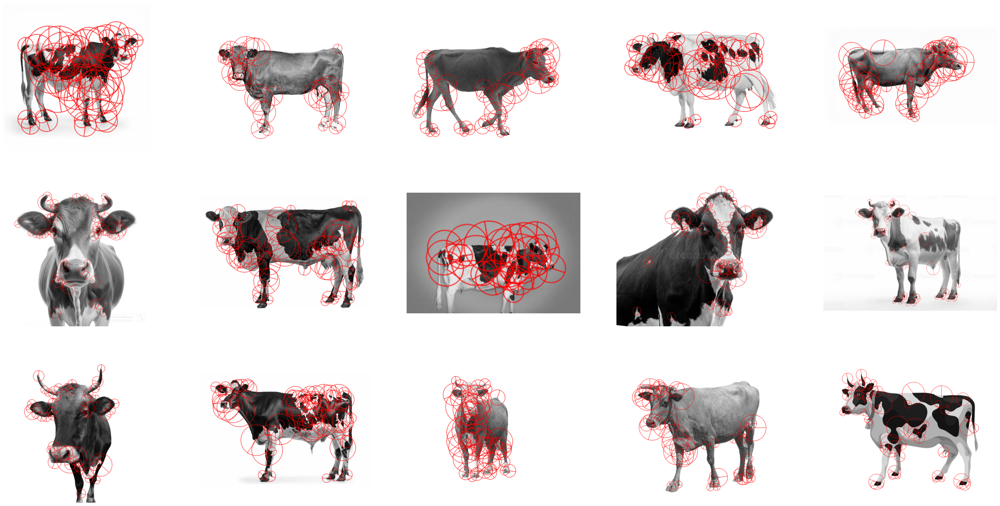

In [88]:
# 5. Visualise retained keypoints
cow_imgs_nms = [cv.drawKeypoints(img, kp_data, np.zeros(img.shape), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(255, 0, 0)) for img, kp_data in zip(cow_imgs, keypoints_nms)]
showImages(cow_imgs_nms, rows=3, cols=5)

In [89]:
# 6. Save the NMS‑pruned descriptors and keypoint metadata
def saveNMSData(keypoints, descriptors):
    # transform keypoints into numpy array
    transformed = []
    
    for kp_data in keypoints:
        sub = [[kp.pt, kp.size, kp.angle, kp.response, kp.octave, kp.class_id] for kp in kp_data]
        transformed.append(sub)

    np.save("features/keypoints_nms.npy", np.array(transformed, dtype=object))
    np.save("features/descriptors_nms.npy", np.array(descriptors_nms, dtype=object))

saveNMSData(keypoints_nms, descriptors_nms)

# Feature‑Space Clustering and Spatial Analysis
**Assumes the variables created in the previous code cells are present**:
* `images` – list of RGB images
* `image_files` – corresponding filenames
* `keypoints_nms` – list of non‑maximum‑suppressed keypoint lists per image
* `descriptors_nms` – matching list of NumPy descriptor matrices (`uint8`, 32 × N)

Run this notebook in the *same* kernel session **after** executing the extraction notebook, or paste these cells below the earlier ones.

### Pipeline
 7. Cluster keypoint descriptors (enhanced descriptors)
 8. Compute center of gravity of keypoints and displacement vector 
    to center of gravity in every "object" (here: cow) training image
 9. Save per‑cluster & displacement data ("visual words"/"codebook entries" of the objects
10. Generate a check plot for each training image

In [9]:
def loadNMSData():

    temp = np.load("features/keypoints_nms.npy", allow_pickle=True)
    descriptors_nms = np.load("features/descriptors_nms.npy", allow_pickle=True)
    keypoints_nms = []

    for tmp in temp:
        kp_data = [cv.KeyPoint(
            x=kp[0][0], 
            y=kp[0][1], 
            size=kp[1], 
            angle=kp[2],
            response=kp[3],
            octave=kp[4],
            class_id=kp[5]
        ) for kp in tmp]
        keypoints_nms.append(kp_data)

    return keypoints_nms, descriptors_nms

# a = keypoints_nms[0][0]
# print("Position:", a.pt)
# print("Größe:", a.size)
# print("Orientierung:", a.angle)
# print("Antwortwert:", a.response)
# print("Oktave:", a.octave)
# print("Klassen-ID:", a.class_id, "\n")

keypoints_nms, descriptors_nms = loadNMSData()
b = keypoints_nms[0][0]
print("Position:", b.pt)
print("Größe:", b.size)
print("Orientierung:", b.angle)
print("Antwortwert:", b.response)
print("Oktave:", b.octave)
print("Klassen-ID:", b.class_id)

Position: (214.99090576171875, 204.24136352539062)
Größe: 111.0786361694336
Orientierung: 85.6492919921875
Antwortwert: 9.659488569013774e-05
Oktave: 7
Klassen-ID: -1


In [157]:
# 7. Cluster keypoint descriptors (enhanced descriptors)

def NGC(dp1: np.ndarray, dp2: np.ndarray):

  dp1_mean = np.mean(dp1)
  dp2_mean = np.mean(dp2)
  diff1 = dp1 - dp1_mean
  diff2 = dp2 - dp2_mean
  prod1 = np.sum(diff1 * diff2)
  prod2 = np.sqrt(np.sum(diff1 ** 2) * np.sum(diff2 ** 2))

  return prod1 / prod2 if prod2 != 0 else 0.0

def similarity(cluster1, cluster2):

  # quot = 1 / (len(cluster1) * len(cluster2))
  # sum = 0
  # for p in cluster1:
  #   for q in cluster2:
  #     sum += NGC(p, q)

  # return quot * sum
  return np.mean([NGC(p, q) for q in cluster2 for p in cluster1])

from tqdm import tqdm

def computeSimilarityMatrix(clusters):

  N = len(clusters)
  sim_matrix = np.full((N, N), fill_value=-np.inf)

  for i in range(N):
    sim_matrix[i, i] = 1.0
    for j in range(i + 1, N):
      sim = similarity(clusters[i], clusters[j])
      sim_matrix[i, j] = sim
      sim_matrix[j, i] = sim

  return sim_matrix

# apply iterative merging on the descriptors
def applyClustering(all_descriptors, k=16, threshold=0.8):

  pbar = tqdm(total=len(all_descriptors) - k, desc="Cluster-Progress")
  all_clusters = all_descriptors
  sim_matrix = computeSimilarityMatrix(all_clusters)

  while len(all_clusters) > k:

    best_pair = None
    best_score = -np.inf

    for i in range(len(all_clusters)):
      for j in range(i + 1, len(all_clusters)):
          if sim_matrix[i, j] > best_score:
            best_score = sim_matrix[i, j]
            best_pair = (i, j)

    # if best_score < threshold:
    #   break
    
    i, j = best_pair
    merged_cluster = np.concatenate((all_clusters[i], all_clusters[j]), axis=0)

    for idx in sorted([i, j], reverse=True):
      del all_clusters[idx]
      sim_matrix = np.delete(sim_matrix, idx, axis=0)
      sim_matrix = np.delete(sim_matrix, idx, axis=1)

    all_clusters.append(merged_cluster)
    
    new_row = []
    for s in range(len(all_clusters) - 1):
      sim = similarity(merged_cluster, all_clusters[s])
      new_row.append(sim)
    
    new_row = np.array(new_row)
    sim_matrix = np.vstack([sim_matrix, new_row])
    new_col = np.append(new_row, 1).reshape(-1, 1)
    sim_matrix = np.hstack([sim_matrix, new_col])

    pbar.update(1)
  
  return all_clusters

# at beginning, every descriptor is a cluster
all_descriptors = [[dp] for dp_data in descriptors_nms for dp in dp_data]
descriptor_clusters = applyClustering(all_descriptors, k=16)
print(len(descriptor_clusters))

Cluster-Progress: 100%|██████████| 765/765 [02:34<00:00,  4.96it/s]

16


In [91]:
# 8. Compute center of gravity of keypoints and displacement vector 
#    to center of gravity in every "object" (here: cow) training image
def computeCentroidsAndDPV(keypoints):

    centroids = []
    dpvs = []

    for kp_data in keypoints:
        # compute centroids
        coords = np.array([kp.pt for kp in kp_data])
        centroid = np.mean(coords, axis=0)
        centroids.append(centroid)
        # compute displacement vectors
        # sub = [(x-centroid[0], y-centroid[1]) for (x, y) in coords]
        sub = coords - centroid
        dpvs.append(sub)

    return centroids, dpvs

centroids, dpvs = computeCentroidsAndDPV(keypoints_nms)
print(centroids[0])
print(dpvs[0])

[188.93928999 171.45493852]
[[  26.05161578   32.786425  ]
 [ -27.69611066   11.28734053]
 [  51.13389117   39.95279158]
 [  47.55071551   65.03506697]
 [  36.80117327   47.11915816]
 [  -6.19701093   32.786425  ]
 [ -56.36156171   39.95279158]
 [ -52.77838606  -60.37630235]
 [ -70.69428724   -6.62856828]
 [ -60.54195112  -28.12766802]
 [  64.86942583  -72.91744005]
 [  11.12168414  -60.97350084]
 [ -45.61201948   13.67611922]
 [  11.71889788   11.28734053]
 [  43.96752459    7.70414961]
 [ -42.02882856  -46.04357683]
 [  87.26429278  -27.1323372 ]
 [ -27.69611066  -25.14167558]
 [ -77.86065382  -60.37630235]
 [  49.93949419  102.26033247]
 [-106.82471174  -56.99219286]
 [  86.84955889  -94.73172533]
 [ -16.94655317  -38.87721025]
 [  28.78873736   13.09549177]
 [   0.17307574   -2.24914324]
 [  15.30207354   61.45187605]
 [ -85.25928205  -34.65493547]
 [ 113.46073443  -85.05492937]
 [ -83.5312776   115.39308394]
 [ -95.33928388   -1.5349251 ]
 [-131.3392877   112.22508467]
 [ 112.0207

In [40]:
# 9. Save per‑cluster & displacement data ("visual words"/"codebook entries" of the objects)

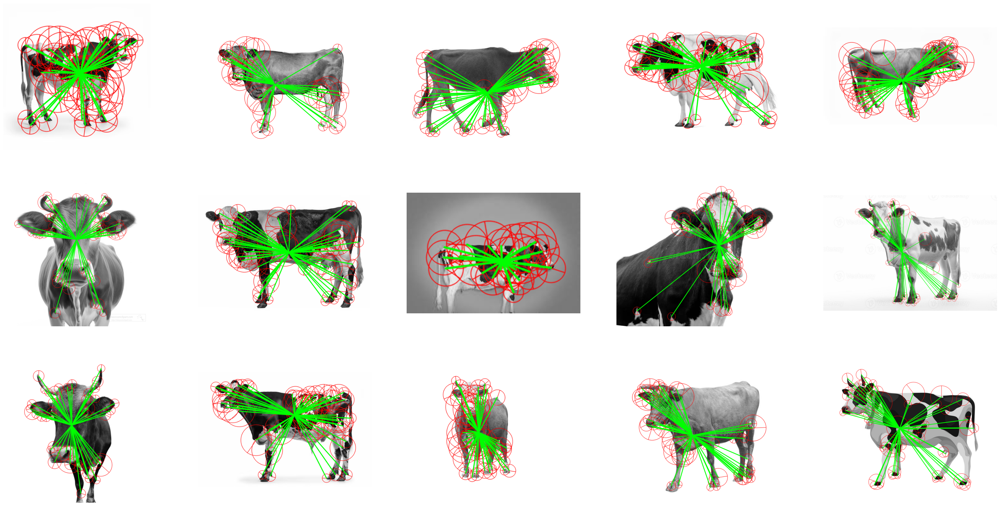

In [ ]:
# 10. Check plot features and displacement vectors for each training image
altered_cow_imgs = []
for img, dpv, centroid in zip(cow_imgs_nms, dpvs, centroids):
    pt2 = tuple(map(int, centroid))
    # print(pt2)
    for d in dpv:
        # pt1 = np.round(d)
        pt1 = tuple(map(int, d + centroid))
        # print(pt1)
        # pt1 = (round(kp.pt[0]), round(kp.pt[1]))
        cv.line(img, pt2, pt1, (0, 255, 0), 2, cv.LINE_AA)

showImages(cow_imgs_nms.copy(), rows=3, cols=5)

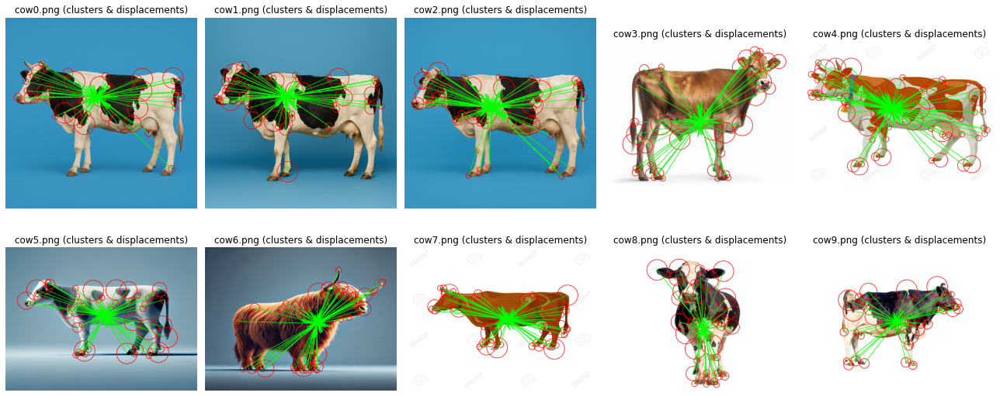

# Let the Features Vote with all their Displacement Vectors:
# Cluster‑wise Displacement Field Visualisation

Essentially, here we apply the detection pipeline to the training images. In general it has to be **applied to the test images**, i.e. in the detection step. We nevertheless do it in order to conduct a plausibility test.

**Prerequisite**:
`images`, `image_files`, `keypoints_nms`, `displacements_per_image`, `cluster_labels_per_image`.

### Pipeline:
11. Build a lookup table that is mapping **all** displacement vectors of a k‑means cluster to a keypoint whose feature vector let's it belong to that cluster.
12. Draw, for every keypoint in every image, **the entire displacement set of its cluster** — giving a dense field that reveals spatial patterns the visual word is linked to.


In [42]:
# 11. Build a lookup table that is mapping **all** displacement vectors of a k‑means cluster to a keypoint whose feature vector let's it belong to that cluster.

In [43]:
# 12. Draw, for every keypoint in every image, **the entire displacement set of its cluster** — giving a dense field that reveals spatial patterns the visual word is linked to.

# Save *all* enriched feature data to file
Pack every datum you now have — i.e. keypoint metadata, descriptors, cluster labels, displacement vectors, **and** the global displacement lists per cluster — into self‑contained, human‑readable files.

For instance:

* For each image write a compressed **`.npz`**:
  * `x`, `y`, `size`, `angle`, `response`, `cluster`, `dx`, `dy`, `descriptors` (Your features may have different data.)
* A single **`cluster_displacements.json`** maps each k‑means label to the list of `[dx, dy]` vectors observed in that cluster.

In [44]:
# 13. Save all enriched feature data to file

In [45]:
# 14. Make sure you are also able to read the data of the files back into memory

# Voting Procedure

Implement a voting procedure.

For instance:

15. Put a low resolution grid of voting bins across your image, cast the keypoint's votes to the bins, count the votes and display them. It may be adequate to indicate the grid cell with maximum votes in a special way.

In [46]:
# 15. Put a low resolution grid of voting bins across your image, cast the keypoint's votes to the bins, count the votes and display them.

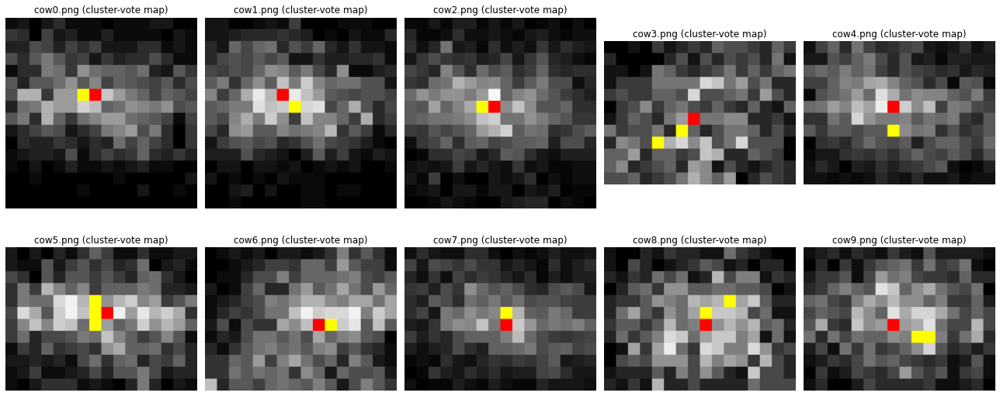

# Background Analysis

Apply this jupyter notebook to the background images also.

For the background images the keypoint clusters and its descriptor vectors are important. The displacement vectors will not be used, as background covers the whole image; it is not limited to a segment covering a part of the image only.

Make sure you do not overwrite the data of the foreground analysis by using adequate file naming conventions.